# ANALISIS DE DISPERSIÓN

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

In [72]:
df = pd.read_csv('C:/Users/jmorano/Documents/Plantillas personalizadas de Office/Coderhouse/Data Science/Modulo 2 - Data Science Fundamentos para la Ciencia de Datos II/Proyecto - Juan Martin Morano/Data/Processed/full_data_flightdelay_processed.csv', sep=',')

In [5]:
# Función para clasificar columnas en continuas, discretas y categóricas
def classify_columns(df):
    # Identificar columnas numéricas y categóricas
    categorical_columns = df.select_dtypes(include=['object']).columns
    discrete_columns = [col for col in df.select_dtypes(include=['int']).columns if df[col].nunique() < 20]
    continuous_columns = [col for col in df.select_dtypes(include=['float', 'int']).columns if col not in discrete_columns]
    
    return discrete_columns, continuous_columns, categorical_columns

discrete_columns, continuous_columns, categorical_columns = classify_columns(df)

if 'Unnamed: 0' in continuous_columns:
    continuous_columns.remove('Unnamed: 0')

print("Discretas:", discrete_columns)
print("Continuas:", continuous_columns)
print("Categóricas:", categorical_columns)

Discretas: ['MONTH', 'DAY_OF_WEEK', 'DEP_DEL15', 'DISTANCE_GROUP', 'SEGMENT_NUMBER', 'AVG_MONTHLY_PASS_AIRLINE']
Continuas: ['CONCURRENT_FLIGHTS', 'NUMBER_OF_SEATS', 'AIRPORT_FLIGHTS_MONTH', 'AIRLINE_FLIGHTS_MONTH', 'AIRLINE_AIRPORT_FLIGHTS_MONTH', 'AVG_MONTHLY_PASS_AIRPORT', 'FLT_ATTENDANTS_PER_PASS', 'GROUND_SERV_PER_PASS', 'PLANE_AGE', 'LATITUDE', 'LONGITUDE', 'PRCP', 'SNOW', 'SNWD', 'TMAX', 'AWND']
Categóricas: Index(['DEP_TIME_BLK', 'CARRIER_NAME', 'DEPARTING_AIRPORT',
       'PREVIOUS_AIRPORT'],
      dtype='object')


## PairPlot

In [7]:
df_continuous = df[continuous_columns + ['DEP_DEL15']]
df_continuous

,CONCURRENT_FLIGHTS,NUMBER_OF_SEATS,AIRPORT_FLIGHTS_MONTH,AIRLINE_FLIGHTS_MONTH,AIRLINE_AIRPORT_FLIGHTS_MONTH,AVG_MONTHLY_PASS_AIRPORT,FLT_ATTENDANTS_PER_PASS,GROUND_SERV_PER_PASS,PLANE_AGE,LATITUDE,LONGITUDE,PRCP,SNOW,SNWD,TMAX,AWND,DEP_DEL15
0,25,143,13056,107363,5873,1903352,0.000062,0.000099,8,36.080,-115.152,0.00,0.0,0.0,65.0,2.91,0
1,29,191,13056,73508,1174,1903352,0.000144,0.000149,3,36.080,-115.152,0.00,0.0,0.0,65.0,2.91,0
2,27,199,13056,73508,1174,1903352,0.000144,0.000149,18,36.080,-115.152,0.00,0.0,0.0,65.0,2.91,0
3,27,180,13056,73508,1174,1903352,0.000144,0.000149,2,36.080,-115.152,0.00,0.0,0.0,65.0,2.91,0
4,10,182,13056,15023,1257,1903352,0.000009,0.000125,1,36.080,-115.152,0.00,0.0,0.0,65.0,2.91,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6460584,3,123,1318,7268,757,133573,0.000120,0.000198,18,21.979,-159.346,0.06,0.0,0.0,84.0,15.21,0
6460585,2,123,1318,7268,757,133573,0.000120,0.000198,16,21.979,-159.346,0.06,0.0,0.0,84.0,15.21,0
6460586,2,123,1318,7268,757,133573,0.000120,0.000198,18,21.979,-159.346,0.06,0.0,0.0,84.0,15.21,0
6460587,3,123,1318,7268,757,133573,0.000120,0.000198,18,21.979,-159.346,0.06,0.0,0.0,84.0,15.21,0


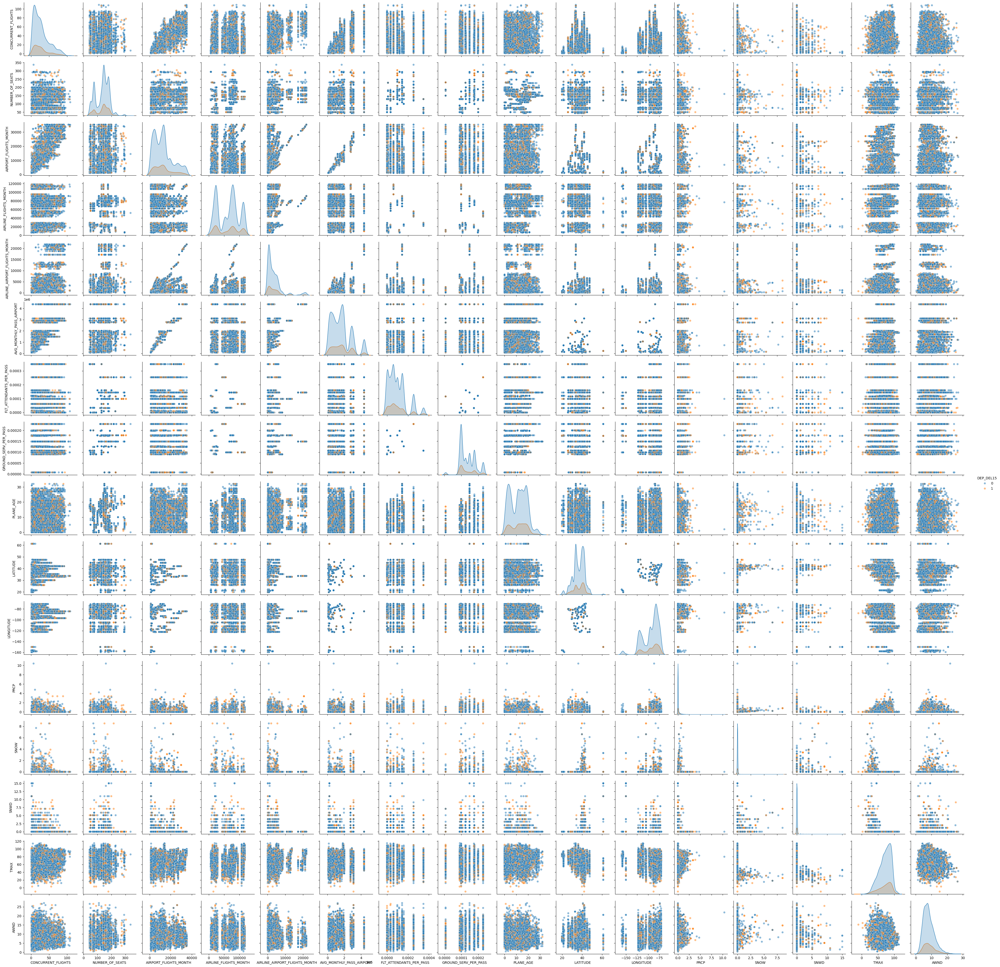

In [9]:
df_sample = df_continuous.sample(10000, random_state=42)
sns.pairplot(data=df_sample, hue="DEP_DEL15", plot_kws={'alpha':0.5})
#Guardamos la visualización en 'Imagenes' para un mejor uso
plt.savefig('C:/Users/jmorano/Documents/Plantillas personalizadas de Office/Coderhouse/Data Science/Modulo 2 - Data Science Fundamentos para la Ciencia de Datos II/Proyecto - Juan Martin Morano/PairPlot_Project.png')
plt.show()

## Gráficos de Relaciones Específicas

### Variables Operativas

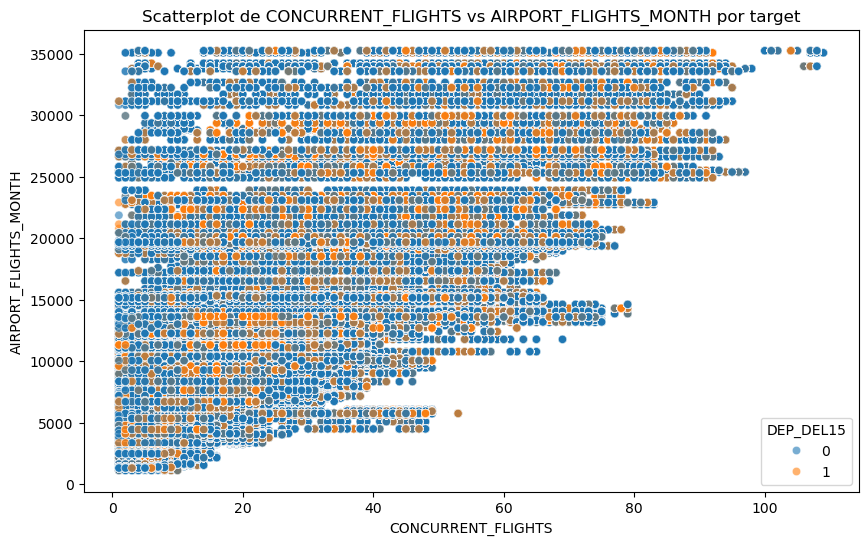

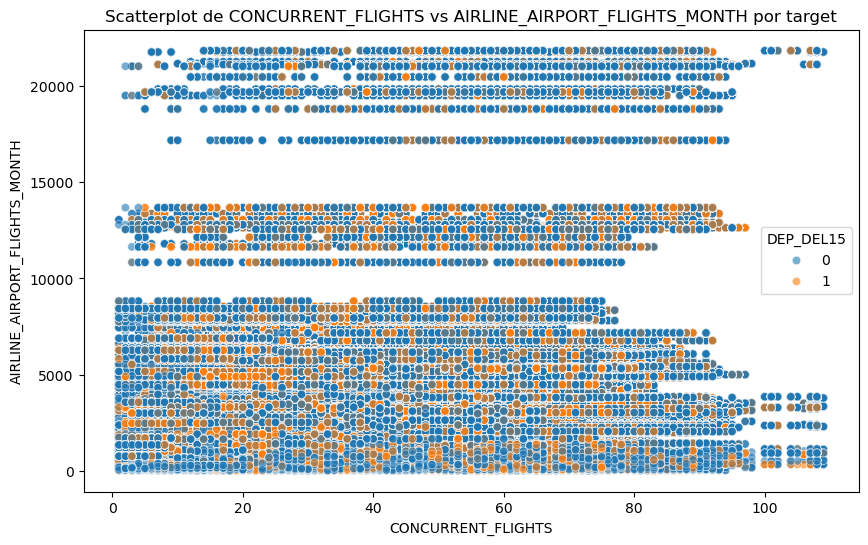

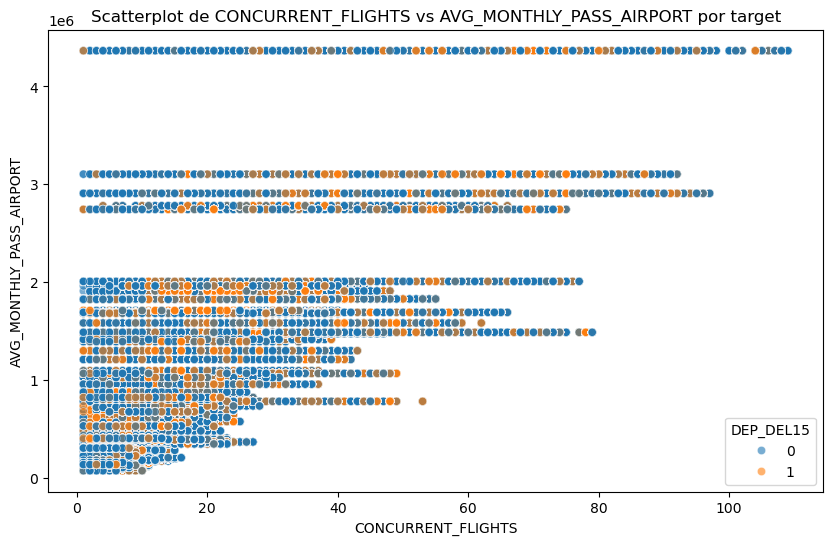

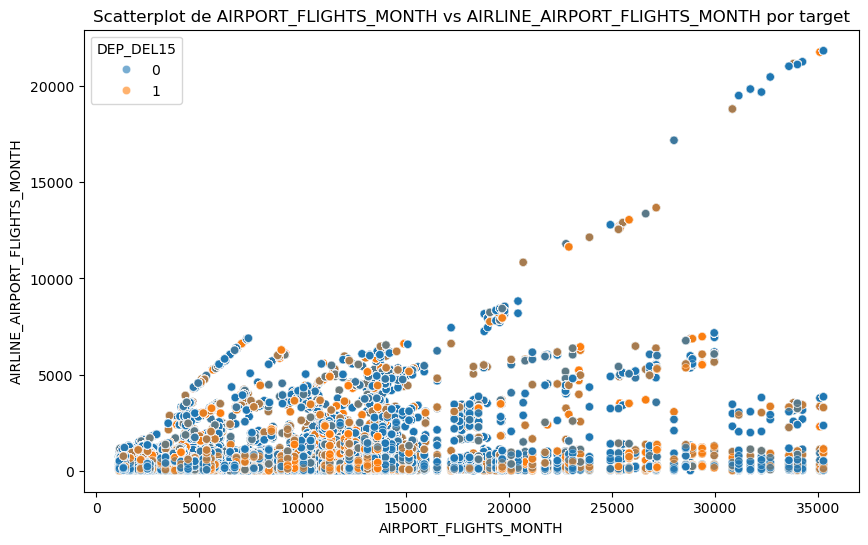

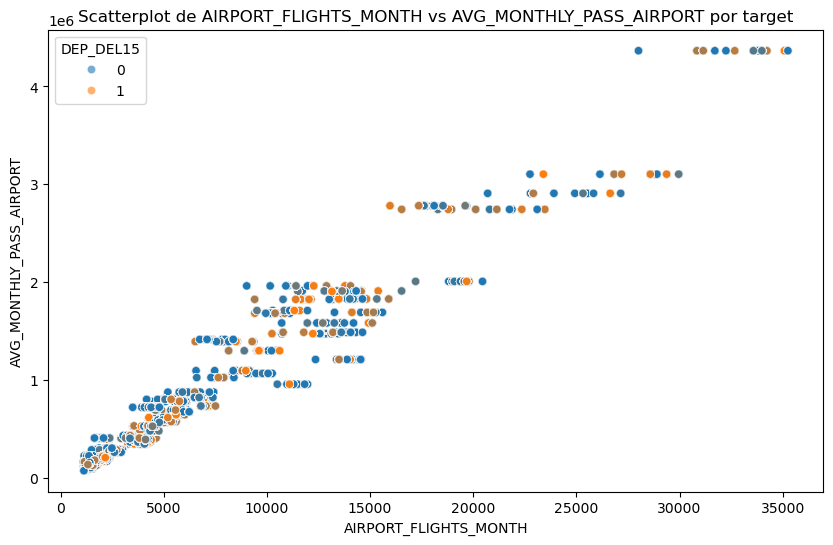

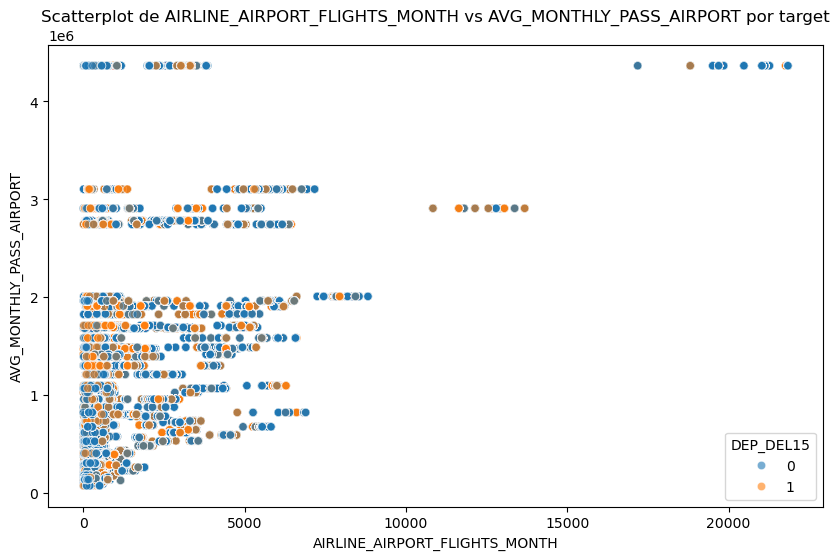

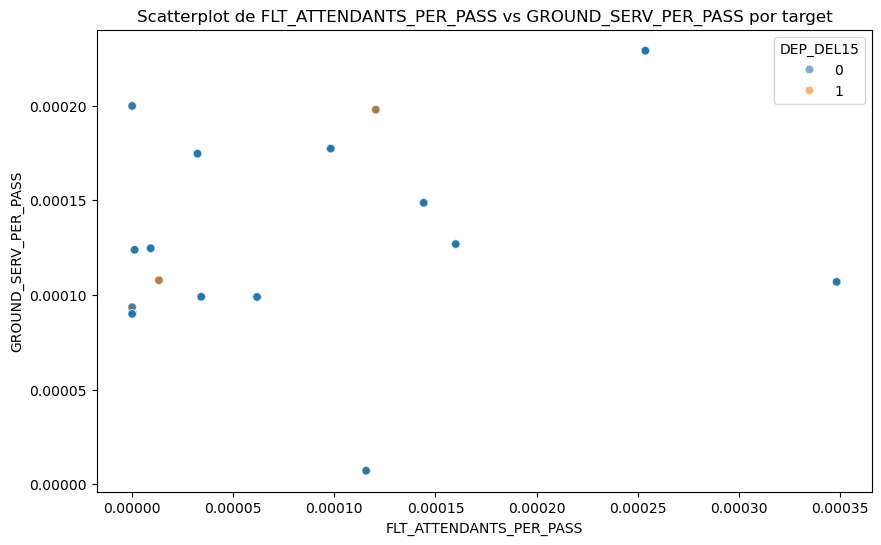

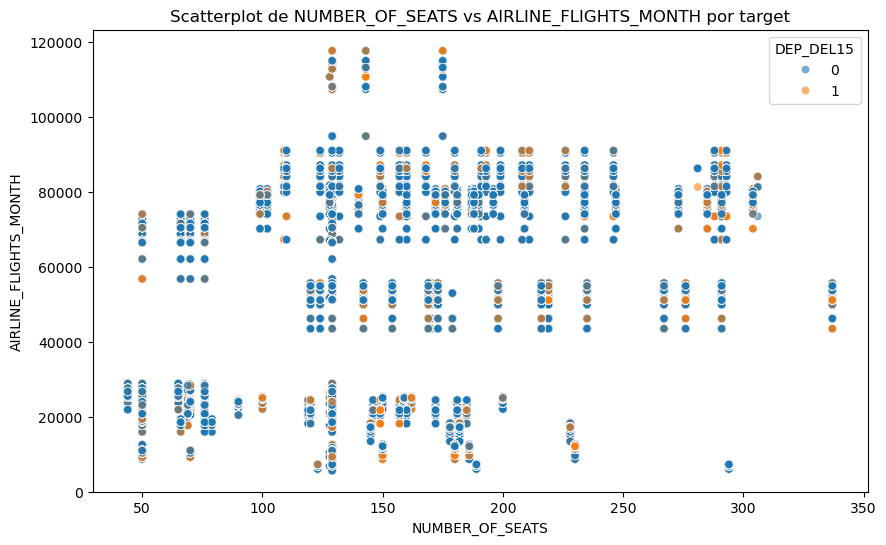

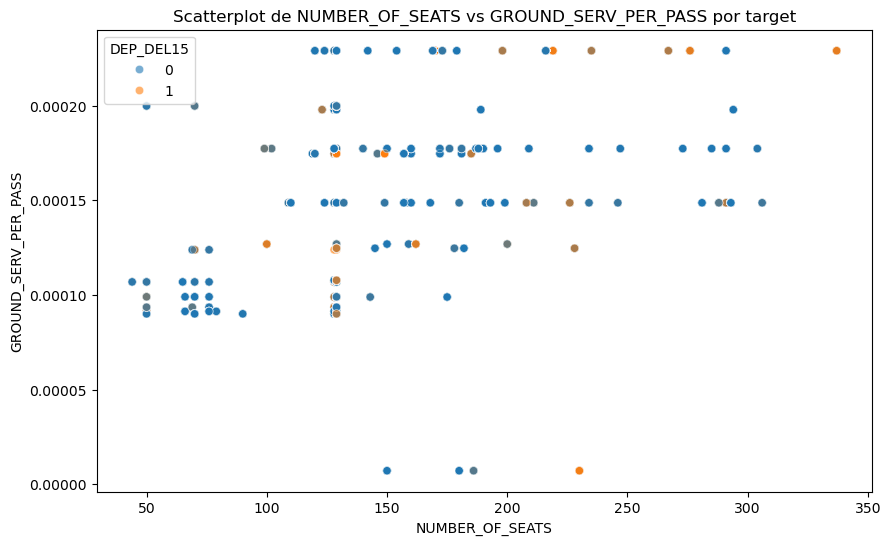

In [45]:
variables_to_compare = [("CONCURRENT_FLIGHTS","AIRPORT_FLIGHTS_MONTH"), ("CONCURRENT_FLIGHTS","AIRLINE_AIRPORT_FLIGHTS_MONTH"), 
                        ("CONCURRENT_FLIGHTS","AVG_MONTHLY_PASS_AIRPORT"), ("AIRPORT_FLIGHTS_MONTH","AIRLINE_AIRPORT_FLIGHTS_MONTH"),
                       ("AIRPORT_FLIGHTS_MONTH","AVG_MONTHLY_PASS_AIRPORT"), ("AIRLINE_AIRPORT_FLIGHTS_MONTH","AVG_MONTHLY_PASS_AIRPORT"),
                       ("FLT_ATTENDANTS_PER_PASS","GROUND_SERV_PER_PASS"), ("NUMBER_OF_SEATS","AIRLINE_FLIGHTS_MONTH"),
                       ("NUMBER_OF_SEATS","GROUND_SERV_PER_PASS")]
for x_var, y_var in variables_to_compare:
    plt.figure(figsize=(10,6))
    sns.scatterplot(x = x_var, y = y_var, hue="DEP_DEL15", data=df_continuous, alpha=0.6)
    plt.title(f"Scatterplot de {x_var} vs {y_var} por target")
    plt.show()

### Variables Climáticas

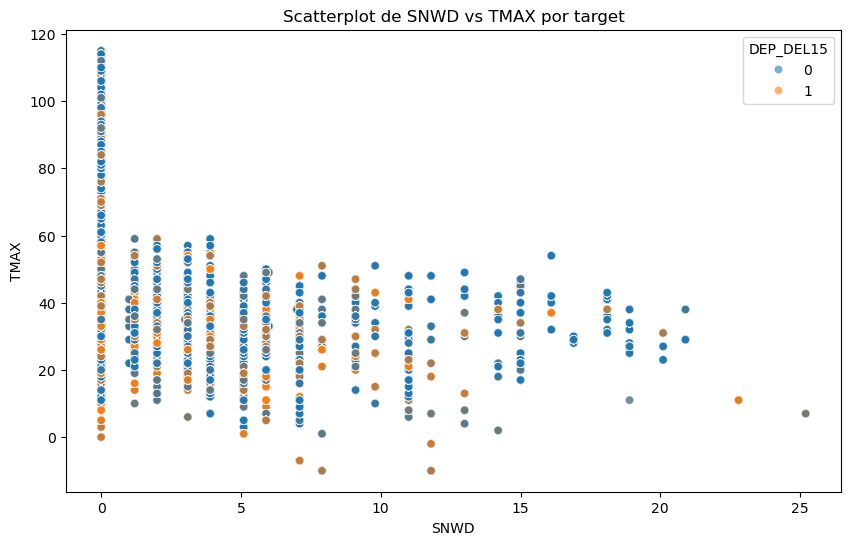

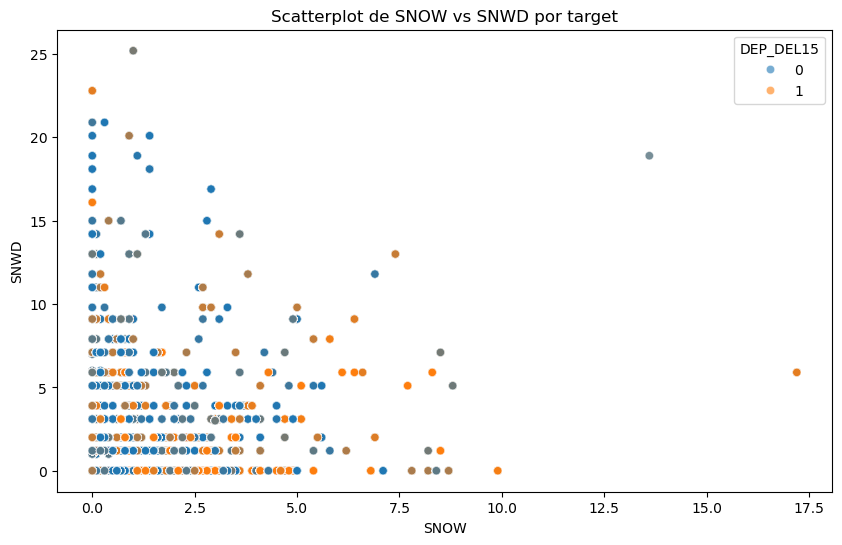

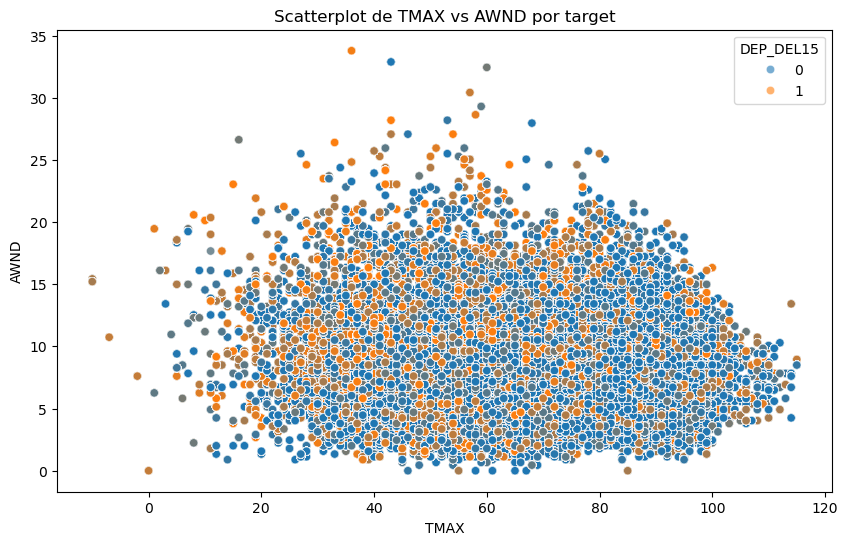

In [57]:
variables_to_compare = [("SNWD","TMAX"), ("SNOW","SNWD"), ("TMAX","AWND")]
for x_var, y_var in variables_to_compare:
    plt.figure(figsize=(10,6))
    sns.scatterplot(x=x_var, y = y_var, hue="DEP_DEL15", data=df, alpha=0.6)
    plt.title(f"Scatterplot de {x_var} vs {y_var} por target")
    plt.show()

### Otras Variables

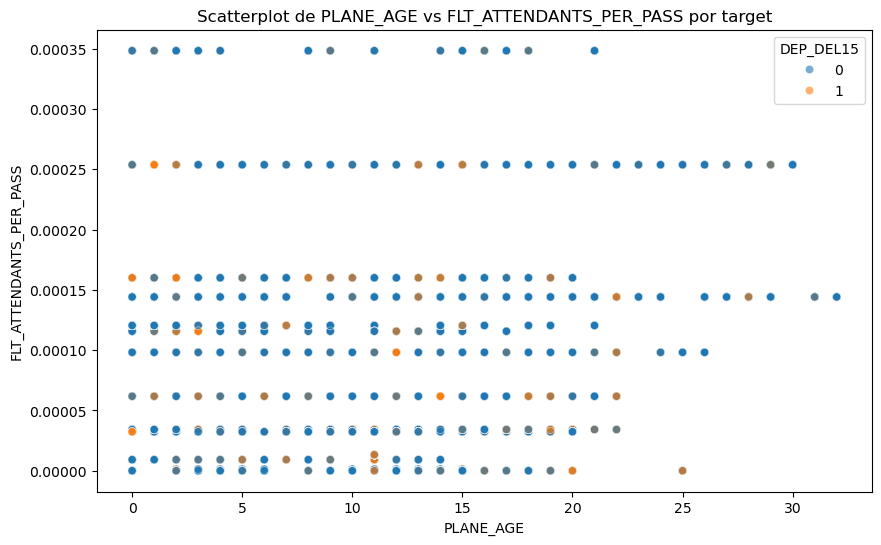

In [62]:
variables_to_compare = [("PLANE_AGE","FLT_ATTENDANTS_PER_PASS")]
for x_var, y_var in variables_to_compare:
    plt.figure(figsize=(10,6))
    sns.scatterplot(x=x_var, y = y_var, hue="DEP_DEL15", data=df, alpha=0.6)
    plt.title(f"Scatterplot de {x_var} vs {y_var} por target")
    plt.show()